<div dir="rtl" style="text-align: right;">

# نوبیتکس API: دریافت و نمایش داده‌های بیت‌کوین به ریال

این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت می‌کند، سپس آن را به یک DataFrame در pandas تبدیل کرده و با استفاده از Plotly به صورت نمودار کندل‌استیک نمایش می‌دهد. داده‌ها برای ۳۰ روز گذشته با رزولوشن ۴ ساعته دریافت می‌شوند.

---

## مراحل:

### 1. تنظیمات:
- **نماد:** BTCIRT (بیت‌کوین به ریال)
- **رزولوشن:** ۴ ساعته (240)
- **محدوده زمانی:** دریافت داده‌های ۳۰ روز گذشته

### 2. درخواست به API:
- استفاده از API نوبیتکس (`/market/udf/history`) برای دریافت داده‌ها.
- پارامترهای ارسال شامل نماد، رزولوشن و بازه زمانی است.

### 3. پردازش داده‌ها:
- بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست.
- ساخت DataFrame شامل ستون‌های زیر:
  - **زمان:** `timestamp`
  - **قیمت آغازین:** `open`
  - **بالاترین قیمت:** `high`
  - **پایین‌ترین قیمت:** `low`
  - **قیمت پایانی:** `close`
  - **حجم معاملات:** `volume`
- تبدیل ستون `timestamp` از فرمت UNIX به تاریخ قابل خواندن.

### 4. نمایش داده‌ها:
- برای نمایش حرکات قیمتی، ساخت نمودار کندل‌استیک با استفاده از Plotly.
- نمایش قیمت‌های آغازین، بالاترین، پایین‌ترین و پایانی برای هر بازه.

---

## خروجی:
- **داده‌های اولیه:** چند سطر اول DataFrame نمایش داده می‌شود.
- **نمودار:** نمودار کندل‌استیک برای نمایش روند قیمتی نمایش داده می‌شود.

---

## نکات:
- در صورت بروز خطا در درخواست به API، پیغام خطای مناسبی نمایش داده می‌شود.
- برای تغییر در تحلیل‌ها، می‌توانید مقادیر `symbol`، `resolution` و بازه زمانی را تغییر دهید.

</div>


In [1]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")


# تنظیمات
symbol = 'BTCIRT'  # نماد بیت‌کوین به ریال
resolution = '240'  # 4 ساعت (240 دقیقه)
to_date = datetime.now()# دریافت و نمایش داده‌های بیت‌کوین به ریال از API نوبیتکس
from_date = to_date - timedelta(days=30)  # دریافت داده‌های ۳۰ روز گذشته

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست به API نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

# بررسی وضعیت پاسخ
if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # تبدیل timestamp به datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')
    
    # نمایش داده‌های اولیه
    print(df.head())
    
    # رسم نمودار با Plotly
    fig = go.Figure(data=[
        go.Candlestick(
            x=df['timestamp'],
            open=df['open'],
            high=df['high'],
            low=df['low'],
            close=df['close'],
            name='BTC/IRT'
        )
    ])

    # تنظیمات نمودار
    fig.update_layout(
        title='Bitcoin to Rial (4-hour timeframe)',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    
    # نمایش نمودار
    fig.show()
else:
    print('خطا در دریافت داده‌ها:', data.get('errmsg', 'نامشخص'))


C:\Users\Administrator\Downloads\Programs\WPy64-31050\python-3.10.5.amd64\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\Administrator\Downloads\Programs\WPy64-31050\python-3.10.5.amd64\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


            timestamp          open          high           low         close  \
0 2024-11-28 08:30:00  6.652067e+09  6.720000e+09  6.645049e+09  6.711000e+09   
1 2024-11-28 12:30:00  6.711000e+09  6.727000e+09  6.650800e+09  6.651000e+09   
2 2024-11-28 16:30:00  6.650800e+09  6.679000e+09  6.650000e+09  6.652183e+09   
3 2024-11-28 20:30:00  6.652183e+09  6.710000e+09  6.640000e+09  6.685004e+09   
4 2024-11-29 00:30:00  6.690000e+09  6.740000e+09  6.680000e+09  6.706000e+09   

     volume  
0  2.256661  
1  2.952102  
2  2.478889  
3  1.821875  
4  1.167876  


<div dir="rtl" style="text-align: right;">

# نوبیتکس API: دریافت داده‌های بیت‌کوین به ریال و پیاده‌سازی استراتژی EMA

این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و با استفاده از میانگین متحرک نمایی (EMA) استراتژی معاملاتی ساده‌ای را پیاده‌سازی می‌کند. بازدهی نهایی استراتژی محاسبه شده و نمودار کندل‌استیک با EMA رسم می‌شود.

---

## مراحل:

### 1. تنظیمات:
- **نماد:** BTCIRT (بیت‌کوین به ریال)
- **رزولوشن:** ۸ ساعته (360)
- **محدوده زمانی:** دریافت داده‌های یک سال گذشته

### 2. درخواست به API:
- استفاده از API نوبیتکس (`/market/udf/history`) برای دریافت داده‌ها.
- پارامترهای ارسال شامل نماد، رزولوشن و بازه زمانی است.

### 3. پردازش داده‌ها:
- بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست.
- ساخت DataFrame شامل ستون‌های زیر:
  - **زمان:** `timestamp`
  - **قیمت آغازین:** `open`
  - **بالاترین قیمت:** `high`
  - **پایین‌ترین قیمت:** `low`
  - **قیمت پایانی:** `close`
  - **حجم معاملات:** `volume`
- تبدیل ستون `timestamp` از فرمت UNIX به تاریخ قابل خواندن.

### 4. پیاده‌سازی استراتژی:
- محاسبه EMA با دوره زمانی ۲۰ کندل.
- اعمال استراتژی معاملاتی:
  - **لانگ:** زمانی که قیمت بالاتر از EMA باشد.
  - **شورت:** زمانی که قیمت پایین‌تر از EMA باشد.
- محاسبه تغییرات سود و زیان استراتژی و بازدهی نهایی.

### 5. نمایش داده‌ها:
- نمایش داده‌های اولیه شامل قیمت پایانی، EMA و موقعیت‌های معاملاتی.
- رسم نمودار کندل‌استیک با EMA برای نمایش روند قیمتی.

---

## خروجی:
- **داده‌های اولیه:** چند سطر اول DataFrame شامل ستون‌های استراتژی نمایش داده می‌شود.
- **نمودار:** نمودار کندل‌استیک و EMA برای تحلیل روند قیمتی رسم می‌شود.

---

## نکات:
- در صورت بروز خطا در درخواست به API، پیغام خطای مناسبی نمایش داده می‌شود.
- برای تغییر در تحلیل‌ها، می‌توانید مقادیر `symbol`، `resolution` و بازه زمانی را تغییر دهید.

</div>


In [2]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'  # نماد بیت‌کوین به ریال
resolution = '360'  # 8 ساعت (480 دقیقه)
to_date = datetime.now()
from_date = to_date - timedelta(days=365)  # دریافت داده‌های ۳۰ روز گذشته

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست به API نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

# بررسی وضعیت پاسخ
if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # تبدیل timestamp به datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')
    
    # محاسبه EMA
    ema_period = 20  # دوره زمانی EMA (20 کندل)
    df['ema'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # بک‌تست استراتژی
    df['position'] = 0  # پوزیشن‌های معاملاتی: 1 = لانگ، -1 = شورت، 0 = بدون معامله
    df.loc[df['close'] > df['ema'], 'position'] = 1  # لانگ
    df.loc[df['close'] < df['ema'], 'position'] = -1  # شورت

    # محاسبه تغییرات سود و زیان
    df['returns'] = df['close'].pct_change()
    df['strategy_returns'] = df['position'].shift(1) * df['returns']  # تغییرات سود استراتژی

    # محاسبه بازدهی نهایی
    cumulative_strategy_returns = (1 + df['strategy_returns']).cumprod()

    # نمایش داده‌های اولیه
    print(df[['timestamp', 'close', 'ema', 'position', 'strategy_returns']].head())
    
    # رسم نمودار کندل‌استیک با EMA
    fig = go.Figure()

    # اضافه کردن نمودار کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='BTC/IRT'
    ))

    # اضافه کردن EMA
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['ema'],
        mode='lines',
        name='EMA',
        line=dict(color='blue', width=2)
    ))

    # تنظیمات نمودار
    fig.update_layout(
        title='Bitcoin to Rial (EMA Strategy)',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )

    # نمایش نمودار
    fig.show()

else:
    print('خطا در دریافت داده‌ها:', data.get('errmsg', 'نامشخص'))


            timestamp         close           ema  position  strategy_returns
0 2023-12-29 08:30:00  2.170891e+09  2.170891e+09         0               NaN
1 2023-12-29 14:30:00  2.154000e+09  2.169282e+09        -1         -0.000000
2 2023-12-29 20:30:00  2.151500e+09  2.167589e+09        -1          0.001161
3 2023-12-30 02:30:00  2.133990e+09  2.164389e+09        -1          0.008138
4 2023-12-30 08:30:00  2.147980e+09  2.162826e+09        -1         -0.006556


<div dir="rtl" style="text-align: right;">

<h1>استراتژی معاملاتی با استفاده از دو EMA</h1>

<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و دو میانگین متحرک نمایی (EMA) سریع و کند را محاسبه می‌کند. سپس بر اساس شرایط مختلف، استراتژی‌های <strong>Trend Following</strong> و <strong>Mean Reversion</strong> اعمال شده و سود استراتژی محاسبه و نمایش داده می‌شود.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li><strong>نماد:</strong> BTCIRT</li>
    <li><strong>رزولوشن:</strong> ۶ ساعت (دقیقه360)</li>
    <li><strong>بازه زمانی:</strong> ۳۶۵ روز گذشته</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها.</li>
    <li>پارامترهای ارسال شامل نماد، رزولوشن و بازه زمانی است.</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست.</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li><strong>زمان:</strong> <code>timestamp</code></li>
            <li><strong>قیمت آغازین:</strong> <code>open</code></li>
            <li><strong>بالاترین قیمت:</strong> <code>high</code></li>
            <li><strong>پایین‌ترین قیمت:</strong> <code>low</code></li>
            <li><strong>قیمت پایانی:</strong> <code>close</code></li>
            <li><strong>حجم معاملات:</strong> <code>volume</code></li>
        </ul>
    </li>
    <li>محاسبه دو EMA:
        <ul>
            <li><strong>EMA سریع:</strong> دوره ۱۰ کندل</li>
            <li><strong>EMA کند:</strong> دوره ۳۰ کندل</li>
        </ul>
    </li>
</ul>

<h3>۴. پیاده‌سازی استراتژی:</h3>
<ul>
    <li>تعیین موقعیت معاملاتی:
        <ul>
            <li><strong>Trend Following:</strong> باز کردن و بستن موقعیت‌ها بر اساس EMA سریع و کند.</li>
            <li><strong>Mean Reversion:</strong> باز کردن و بستن موقعیت‌ها بر اساس EMA سریع و کند.</li>
        </ul>
    </li>
    <li>محاسبه بازدهی استراتژی و بازدهی تجمعی.</li>
</ul>

<h3>۵. نمایش داده‌ها و نمودارها:</h3>
<ul>
    <li>رسم نمودار کندل‌استیک به همراه EMA سریع و کند با استفاده از Plotly.</li>
    <li>رسم بازدهی تجمعی استراتژی با استفاده از Matplotlib.</li>
    <li>نمایش توزیع سود و زیان معاملات در قالب هیستوگرام.</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>چند سطر اول DataFrame برای بررسی داده‌ها نمایش داده می‌شود.</li>
    <li>نمودار کندل‌استیک با EMA سریع و کند.</li>
    <li>نمودار بازدهی تجمعی استراتژی.</li>
    <li>توزیع سود و زیان معاملات به صورت هیستوگرام.</li>
</ul>

</div>


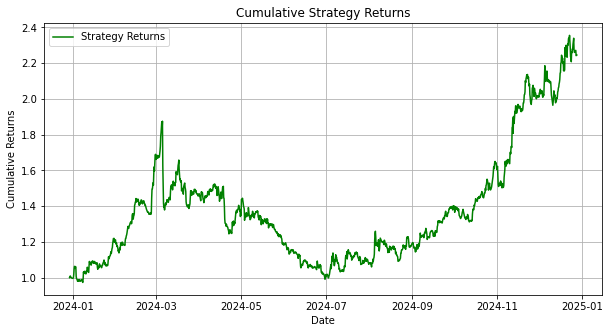

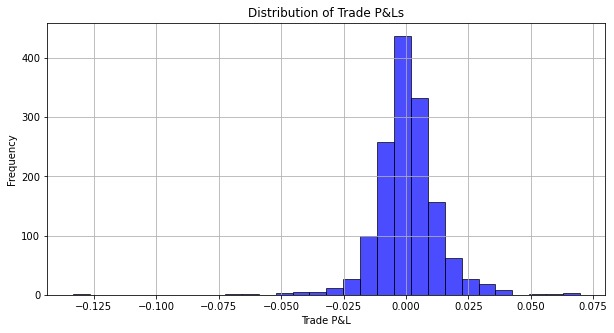

In [3]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Settings
symbol = 'BTCIRT'
resolution = '360'  # 8-hour timeframe
to_date = datetime.now()
from_date = to_date - timedelta(days=365)  # 30 days of data

# Convert timestamps
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# Request data from Nobitex
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

# Validate response
if data['s'] == 'ok':
    # Create DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # Convert timestamp to datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # Compute EMA
    fast_ema_period = 10
    slow_ema_period = 30
    df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

    # Implement strategy logic
    df['position'] = 0  # Initial position

    # Trend-following conditions
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # Open long trend-following
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1  # Close long, open short

    # Mean-reversion conditions
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1  # Open long mean-reversion
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1  # Close long mean-reversion

    # Calculate returns
    df['returns'] = df['close'].pct_change()
    df['strategy_returns'] = df['position'].shift(1) * df['returns']

    # Calculate cumulative returns
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # Plot price with EMA and signals
    fig = go.Figure()

    # Candlestick chart
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # Fast EMA
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # Slow EMA
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # Chart settings
    fig.update_layout(
        title='Bitcoin to Rial with Dual EMA Strategy',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )

    fig.show()

    # Plot cumulative strategy returns
    plt.figure(figsize=(10, 5))
    plt.plot(df['timestamp'], df['cumulative_strategy_returns'], label='Strategy Returns', color='green')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.title('Cumulative Strategy Returns')
    plt.legend()
    plt.grid()
    plt.show()

    # Calculate trade P&Ls
    df['trade_pnl'] = df['strategy_returns'].dropna()
    
    # Plot distribution of trade P&Ls
    plt.figure(figsize=(10, 5))
    plt.hist(df['trade_pnl'], bins=30, color='blue', alpha=0.7, edgecolor='black')
    plt.xlabel('Trade P&L')
    plt.ylabel('Frequency')
    plt.title('Distribution of Trade P&Ls')
    plt.grid()
    plt.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


<li>
    <strong>درخواست به API:</strong>
    <ul>
        <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها.</li>
        <li>پارامترهای ارسال شامل نماد، رزولوشن و بازه زمانی است.</li>
    </ul>
</li>

<li>
    <strong>پردازش داده‌ها:</strong>
    <ul>
        <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست.</li>
        <li>ساخت DataFrame شامل ستون‌های زیر:
            <ul>
                <li><code>timestamp</code>: زمان</li>
                <li><code>open</code>: قیمت آغازین</li>
                <li><code>high</code>: بالاترین قیمت</li>
                <li><code>low</code>: پایین‌ترین قیمت</li>
                <li><code>close</code>: قیمت پایانی</li>
                <li><code>volume</code>: حجم معاملات</li>
            </ul>
        </li>
        <li>محاسبه EMA:
            <ul>
                <li>EMA سریع با دوره 10</li>
                <li>EMA کند با دوره 30</li>
            </ul>
        </li>
    </ul>
</li>

<li>
    <strong>اجرا و اعمال استراتژی:</strong>
    <ul>
        <li>ورود به پوزیشن لانگ در شرایط:
            <ul>
                <li>قیمت بسته شدن &gt; EMA سریع &gt; EMA کند</li>
            </ul>
        </li>
        <li>خروج از لانگ و ورود به شورت در شرایط:
            <ul>
                <li>قیمت بسته شدن &lt; EMA سریع &gt; EMA کند</li>
            </ul>
        </li>
        <li>ورود به پوزیشن لانگ بازگشتی در شرایط:
            <ul>
                <li>قیمت بسته شدن &gt; EMA سریع &lt; EMA کند</li>
            </ul>
        </li>
        <li>خروج از لانگ بازگشتی در شرایط:
            <ul>
                <li>قیمت بسته شدن &lt; EMA سریع &lt; EMA کند</li>
            </ul>
        </li>
    </ul>
</li>

<li>
    <strong>محاسبه سود و زیان:</strong>
    <ul>
        <li>محاسبه سود هر معامله بر اساس موقعیت معاملاتی و تغییرات قیمت.</li>
        <li>محاسبه بازدهی تجمعی استراتژی.</li>
    </ul>
</li>

<li>
    <strong>نمودارها:</strong>
    <ul>
        <li>نمودار کندل‌استیک به همراه EMA سریع و EMA کند.</li>
        <li>نمایش نقاط ورود (سبز) و خروج (قرمز) معاملات.</li>
        <li>نمودار بازدهی تجمعی استراتژی.</li>
    </ul>
</li>


In [4]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # 8 ساعت
to_date = datetime.now()
from_date = to_date - timedelta(days=365)  # ۳۰ روز گذشته

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # تبدیل timestamp به datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # محاسبه EMA
    fast_ema_period = 10
    slow_ema_period = 30
    df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

    # تعریف موقعیت‌ها (پوزیشن‌ها)
    df['position'] = 0

    # استراتژی روند
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # ورود به لانگ
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1  # خروج از لانگ و ورود به شورت

    # استراتژی بازگشتی
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1  # ورود به لانگ بازگشتی
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1  # خروج از لانگ بازگشتی

    # محاسبه سود و زیان
    df['returns'] = df['close'].pct_change()
    df['strategy_returns'] = df['position'].shift(1) * df['returns']
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # مشخص کردن نقاط ورود و خروج
    df['entry_signal'] = (df['position'] > df['position'].shift(1))  # ورود به پوزیشن
    df['exit_signal'] = (df['position'] < df['position'].shift(1))  # خروج از پوزیشن

    # رسم نمودار قیمت و EMAها
    fig = go.Figure()

    # کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # EMA سریع
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # EMA کند
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # نقاط ورود
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_signal'], 'timestamp'],
        y=df.loc[df['entry_signal'], 'close'],
        mode='markers',
        marker=dict(color='green', size=10, symbol='triangle-up'),
        name='Entry'
    ))

    # نقاط خروج
    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_signal'], 'timestamp'],
        y=df.loc[df['exit_signal'], 'close'],
        mode='markers',
        marker=dict(color='red', size=10, symbol='triangle-down'),
        name='Exit'
    ))

    # تنظیمات نمودار
    fig.update_layout(
        title='Bitcoin to Rial with Dual EMA Strategy',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    fig.show()

    # رسم نمودار سود استراتژی
    fig_returns = go.Figure()
    fig_returns.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['cumulative_strategy_returns'],
        mode='lines',
        name='Strategy Returns',
        line=dict(color='green', width=2)
    ))

    # تنظیمات نمودار سود استراتژی
    fig_returns.update_layout(
        title='Cumulative Strategy Returns',
        xaxis_title='Date',
        yaxis_title='Cumulative Returns',
        template='plotly_dark'
    )
    fig_returns.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


<div dir="rtl" style="text-align: right;">

<h1>پیاده‌سازی استراتژی دوگانه EMA برای معاملات بیت‌کوین به ریال</h1>
<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت می‌کند و با استفاده از دو شاخص میانگین متحرک نمایی (EMA)، سیگنال‌های ورود و خروج به معاملات را بر اساس شرایط مختلف تولید می‌کند. همچنین، بازدهی استراتژی محاسبه و نمودارهای قیمت، نقاط ورود و خروج، و بازدهی تجمعی استراتژی رسم می‌شوند.
</p>

<hr>

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li>نماد: BTCIRT (بیت‌کوین به ریال)</li>
    <li>رزولوشن: 360 دقیقه (6 ساعت)</li>
    <li>بازه زمانی: داده‌های 365 روز گذشته</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها</li>
    <li>پارامترهای ارسالی شامل نماد، بازه زمانی، و رزولوشن هستند</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li>زمان: <code>timestamp</code></li>
            <li>قیمت آغازین: <code>open</code></li>
            <li>بالاترین قیمت: <code>high</code></li>
            <li>پایین‌ترین قیمت: <code>low</code></li>
            <li>قیمت پایانی: <code>close</code></li>
            <li>حجم معاملات: <code>volume</code></li>
        </ul>
    </li>
    <li>محاسبه دو EMA:
        <ul>
            <li>EMA سریع با دوره 17</li>
            <li>EMA کند با دوره 21</li>
        </ul>
    </li>
</ul>

<h3>۴. اجرای استراتژی:</h3>
<ul>
    <li>ورود به پوزیشن لانگ و شورت بر اساس شرایط زیر:
        <ul>
            <li>ورود لانگ (Trend Following): قیمت بسته شدن &gt; EMA سریع &gt; EMA کند</li>
            <li>خروج لانگ: تغییر پوزیشن از 1 به 0</li>
            <li>ورود شورت: قیمت بسته شدن &lt; EMA سریع &gt; EMA کند</li>
            <li>خروج شورت: تغییر پوزیشن از -1 به 0</li>
        </ul>
    </li>
    <li>محاسبه بازدهی استراتژی و بازدهی تجمعی</li>
</ul>

<h3>۵. نمایش داده‌ها و نمودارها:</h3>
<ul>
    <li>رسم نمودار کندل‌استیک به همراه EMA سریع و کند</li>
    <li>نمایش نقاط ورود و خروج معاملات:
        <ul>
            <li>ورود لانگ: نشانگر سبز</li>
            <li>خروج لانگ: نشانگر نارنجی</li>
            <li>ورود شورت: نشانگر قرمز</li>
            <li>خروج شورت: نشانگر بنفش</li>
        </ul>
    </li>
    <li>رسم نمودار بازدهی تجمعی استراتژی</li>
</ul>

<hr>

<h2>خروجی:</h2>
<ul>
    <li>چند سطر اولیه از داده‌ها برای بررسی صحت محاسبات</li>
    <li>نمودار قیمت به همراه EMAها و نقاط ورود و خروج</li>
    <li>نمودار بازدهی تجمعی استراتژی</li>
</ul>

<hr>

<h2>نکات:</h2>
<ul>
    <li>برای تنظیم استراتژی، می‌توانید دوره‌های EMA را تغییر دهید</li>
    <li>تحلیل‌های بیشتری می‌توانند با تغییر در بازه زمانی یا پارامترهای استراتژی انجام شوند</li>
</ul>

</div>


In [5]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # 8 ساعت
to_date = datetime.now()
from_date = to_date - timedelta(days=365)  # ۳۰ روز گذشته

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # تبدیل timestamp به datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # محاسبه EMA
    fast_ema_period = 17
    slow_ema_period = 21
    df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

    # تعریف موقعیت‌ها (پوزیشن‌ها)
    df['position'] = 0

    # استراتژی روند
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # ورود به لانگ
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1  # خروج از لانگ و ورود به شورت

    # استراتژی بازگشتی
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1  # ورود به لانگ بازگشتی
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1  # خروج از لانگ بازگشتی

    # محاسبه سود و زیان
    df['returns'] = df['close'].pct_change()
    df['strategy_returns'] = df['position'].shift(1) * df['returns']
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # مشخص کردن نقاط ورود و خروج
    df['entry_long'] = (df['position'] > df['position'].shift(1)) & (df['position'] == 1)  # ورود لانگ
    df['exit_long'] = (df['position'] < df['position'].shift(1)) & (df['position'] == 0)  # خروج لانگ
    df['entry_short'] = (df['position'] < df['position'].shift(1)) & (df['position'] == -1)  # ورود شورت
    df['exit_short'] = (df['position'] > df['position'].shift(1)) & (df['position'] == 0)  # خروج شورت

    # رسم نمودار قیمت و EMAها
    fig = go.Figure()

    # کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # EMA سریع
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # EMA کند
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # نقاط ورود لانگ
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_long'], 'timestamp'],
        y=df.loc[df['entry_long'], 'close'],
        mode='markers',
        marker=dict(color='green', size=12, symbol='triangle-up'),
        name='Long Entry'
    ))

    # نقاط خروج لانگ
    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_long'], 'timestamp'],
        y=df.loc[df['exit_long'], 'close'],
        mode='markers',
        marker=dict(color='orange', size=12, symbol='triangle-down'),
        name='Long Exit'
    ))

    # نقاط ورود شورت
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_short'], 'timestamp'],
        y=df.loc[df['entry_short'], 'close'],
        mode='markers',
        marker=dict(color='red', size=12, symbol='triangle-down'),
        name='Short Entry'
    ))

    # نقاط خروج شورت
    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_short'], 'timestamp'],
        y=df.loc[df['exit_short'], 'close'],
        mode='markers',
        marker=dict(color='purple', size=12, symbol='triangle-up'),
        name='Short Exit'
    ))

    # تنظیمات نمودار قیمت
    fig.update_layout(
        title='Bitcoin to Rial with Dual EMA Strategy',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    fig.show()

    # رسم نمودار سود استراتژی
    fig_returns = go.Figure()
    fig_returns.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['cumulative_strategy_returns'],
        mode='lines',
        name='Strategy Returns',
        line=dict(color='green', width=2)
    ))

    # تنظیمات نمودار سود استراتژی
    fig_returns.update_layout(
        title='Cumulative Strategy Returns',
        xaxis_title='Date',
        yaxis_title='Cumulative Return (Multiplier)',
        template='plotly_dark'
    )
    fig_returns.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


<div dir="rtl" style="text-align: right;">

<h1>بهینه‌سازی استراتژی EMA برای معاملات بیت‌کوین به ریال</h1>

<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و با استفاده از بهینه‌سازی پارامترهای دو میانگین متحرک نمایی (EMA)، بهترین پارامترها را برای استراتژی معاملاتی پیدا می‌کند. در نهایت، بهترین دوره‌های EMA سریع و کند و بازدهی تجمعی مربوط به آن‌ها نمایش داده می‌شود.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li>نماد: BTCIRT (بیت‌کوین به ریال)</li>
    <li>رزولوشن: 360 دقیقه (8 ساعت)</li>
    <li>بازه زمانی: داده‌های 365 روز گذشته</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها</li>
    <li>پارامترهای ارسالی شامل نماد، بازه زمانی، و رزولوشن هستند</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li>زمان: <code>timestamp</code></li>
            <li>قیمت آغازین: <code>open</code></li>
            <li>بالاترین قیمت: <code>high</code></li>
            <li>پایین‌ترین قیمت: <code>low</code></li>
            <li>قیمت پایانی: <code>close</code></li>
            <li>حجم معاملات: <code>volume</code></li>
        </ul>
    </li>
</ul>

<h3>۴. بهینه‌سازی استراتژی:</h3>
<ul>
    <li>تعریف محدوده پارامترها:
        <ul>
            <li>EMA سریع: از 5 تا 20 دوره</li>
            <li>EMA کند: از 20 تا 50 دوره</li>
        </ul>
    </li>
    <li>بررسی تمامی ترکیب‌های ممکن برای دوره‌های EMA:
        <ul>
            <li>شرط: دوره EMA سریع باید کوچک‌تر از دوره EMA کند باشد</li>
        </ul>
    </li>
    <li>پیاده‌سازی استراتژی معاملاتی:
        <ul>
            <li>ورود لانگ: قیمت بسته شدن &gt; EMA سریع &gt; EMA کند</li>
            <li>ورود شورت: قیمت بسته شدن &lt; EMA سریع &gt; EMA کند</li>
        </ul>
    </li>
    <li>محاسبه بازدهی تجمعی استراتژی برای هر ترکیب</li>
    <li>ذخیره بهترین پارامترها بر اساس بالاترین بازدهی تجمعی</li>
</ul>

<h3>۵. نمایش نتایج:</h3>
<ul>
    <li>بهترین پارامترها: دوره‌های EMA سریع و کند</li>
    <li>بهترین بازدهی تجمعی استراتژی</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>بهترین پارامترها و بازدهی تجمعی استراتژی نمایش داده می‌شوند</li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>این کد با استفاده از کتابخانه‌های <code>pandas</code> و <code>requests</code> داده‌ها را پردازش می‌کند</li>
    <li>محدوده پارامترهای EMA قابل تغییر است تا تحلیل‌های بیشتری انجام شود</li>
</ul>

</div>


In [6]:
import requests
import pandas as pd
from datetime import datetime, timedelta
from itertools import product
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # 8 ساعت
to_date = datetime.now()
from_date = to_date - timedelta(days=365)  # 365 روز گذشته

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # تبدیل timestamp به datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # محدوده پارامترهای EMA
    fast_ema_range = range(5, 20)  # دوره‌های سریع
    slow_ema_range = range(20, 50)  # دوره‌های کند

    best_params = None
    best_performance = -float('inf')

    # بررسی همه ترکیب‌های پارامترها
    for fast_ema_period, slow_ema_period in product(fast_ema_range, slow_ema_range):
        if fast_ema_period >= slow_ema_period:
            continue  # شرط برای اطمینان از اینکه fast EMA < slow EMA

        # محاسبه EMAها
        df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
        df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

        # تعریف موقعیت‌ها
        df['position'] = 0
        df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # ورود لانگ
        df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1  # خروج از لانگ و ورود به شورت

        # محاسبه سود و زیان
        df['returns'] = df['close'].pct_change()
        df['strategy_returns'] = df['position'].shift(1) * df['returns']
        cumulative_strategy_returns = (1 + df['strategy_returns']).cumprod().iloc[-1]

        # ذخیره بهترین عملکرد
        if cumulative_strategy_returns > best_performance:
            best_performance = cumulative_strategy_returns
            best_params = (fast_ema_period, slow_ema_period)

    # نمایش بهترین پارامترها و عملکرد
    print(f"Best Parameters: Fast EMA = {best_params[0]}, Slow EMA = {best_params[1]}")
    print(f"Best Cumulative Return: {best_performance:.2f}")

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


Best Parameters: Fast EMA = 13, Slow EMA = 20
Best Cumulative Return: 3.31


<div dir="rtl" style="text-align: right;">

<h1>بهینه‌سازی و بک‌تست استراتژی EMA با احتساب کارمزد</h1>

<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و بهترین پارامترهای دو میانگین متحرک نمایی (EMA) را برای استراتژی معاملاتی پیدا می‌کند. همچنین، سود و زیان استراتژی با احتساب کارمزد ۰.۲٪ محاسبه و نمودارهای مرتبط نمایش داده می‌شوند.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li>نماد: BTCIRT (بیت‌کوین به ریال)</li>
    <li>رزولوشن: ۳۶۰ دقیقه (۶ ساعت)</li>
    <li>بازه زمانی: ۱۵۰۰ روز گذشته</li>
    <li>کارمزد معاملات: ۰.۲٪</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها</li>
    <li>پارامترهای ارسالی شامل نماد، بازه زمانی، و رزولوشن هستند</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li>زمان: <code>timestamp</code></li>
            <li>قیمت آغازین: <code>open</code></li>
            <li>بالاترین قیمت: <code>high</code></li>
            <li>پایین‌ترین قیمت: <code>low</code></li>
            <li>قیمت پایانی: <code>close</code></li>
            <li>حجم معاملات: <code>volume</code></li>
        </ul>
    </li>
</ul>

<h3>۴. بهینه‌سازی استراتژی:</h3>
<ul>
    <li>تعریف محدوده پارامترهای EMA:
        <ul>
            <li>EMA سریع: ۵ تا ۲۰ دوره</li>
            <li>EMA کند: ۲۰ تا ۵۰ دوره</li>
        </ul>
    </li>
    <li>بررسی تمامی ترکیب‌های ممکن برای دوره‌های EMA:
        <ul>
            <li>شرط: دوره EMA سریع باید کوچک‌تر از دوره EMA کند باشد</li>
        </ul>
    </li>
    <li>محاسبه بازدهی استراتژی با احتساب کارمزد برای هر ترکیب</li>
    <li>ذخیره بهترین پارامترها بر اساس بالاترین بازدهی تجمعی</li>
</ul>

<h3>۵. اجرای بک‌تست با بهترین پارامترها:</h3>
<ul>
    <li>محاسبه EMA سریع و کند با بهترین پارامترها</li>
    <li>تعیین موقعیت معاملاتی:
        <ul>
            <li>ورود لانگ: قیمت بسته شدن &gt; EMA سریع &gt; EMA کند</li>
            <li>ورود شورت: قیمت بسته شدن &lt; EMA سریع &gt; EMA کند</li>
        </ul>
    </li>
    <li>محاسبه سود و زیان استراتژی با احتساب کارمزد</li>
    <li>مشخص کردن نقاط ورود و خروج معاملات</li>
</ul>

<h3>۶. نمایش نتایج:</h3>
<ul>
    <li>بهترین پارامترهای EMA (سریع و کند)</li>
    <li>بازدهی تجمعی بهترین استراتژی</li>
    <li>نمودار قیمت به همراه EMAها و نقاط ورود و خروج</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>بهترین پارامترها و بازدهی تجمعی استراتژی نمایش داده می‌شوند</li>
    <li>نمودار کندل‌استیک با EMA سریع و کند و نقاط ورود و خروج</li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>این کد با استفاده از کتابخانه‌های <code>pandas</code>، <code>requests</code> و <code>plotly</code> داده‌ها را پردازش و نمایش می‌دهد</li>
    <li>می‌توانید محدوده پارامترهای EMA را تغییر دهید تا تحلیل‌های بیشتری انجام شود</li>
</ul>

</div>


In [7]:
import requests
import pandas as pd
from datetime import datetime, timedelta
from itertools import product
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # تایم‌فریم شش ساعته
to_date = datetime.now()
from_date = to_date - timedelta(days=1500)  # ذو سال گذشته
fee = 0.002  # کارمزد ۰.۲٪

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    # تبدیل timestamp به datetime
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # محدوده پارامترهای EMA
    fast_ema_range = range(5, 20)  # دوره‌های سریع
    slow_ema_range = range(20, 50)  # دوره‌های کند

    best_params = None
    best_performance = -float('inf')

    # بررسی همه ترکیب‌های پارامترها
    for fast_ema_period, slow_ema_period in product(fast_ema_range, slow_ema_range):
        if fast_ema_period >= slow_ema_period:
            continue  # شرط برای اطمینان از اینکه fast EMA < slow EMA

        # محاسبه EMAها
        df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
        df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

        # تعریف موقعیت‌ها
        df['position'] = 0
        df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # ورود لانگ
        df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1  # ورود شورت

        # محاسبه سود و زیان با لحاظ کارمزد
        df['returns'] = df['close'].pct_change()
        df['trade'] = df['position'].diff().abs()  # تغییر موقعیت نشان‌دهنده معامله است
        df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
        cumulative_strategy_returns = (1 + df['strategy_returns']).cumprod().iloc[-1]

        # ذخیره بهترین عملکرد
        if cumulative_strategy_returns > best_performance:
            best_performance = cumulative_strategy_returns
            best_params = (fast_ema_period, slow_ema_period)

    # بهترین پارامترها
    print(f"Best Parameters: Fast EMA = {best_params[0]}, Slow EMA = {best_params[1]}")
    print(f"Best Cumulative Return (after fees): {best_performance:.2f}")

    # اجرای بک‌تست با بهترین پارامترها
    df['fast_ema'] = df['close'].ewm(span=best_params[0], adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=best_params[1], adjust=False).mean()
    df['position'] = 0
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1
    df['returns'] = df['close'].pct_change()
    df['trade'] = df['position'].diff().abs()
    df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # نقاط ورود و خروج
    df['entry_long'] = (df['position'] > df['position'].shift(1)) & (df['position'] == 1)
    df['exit_long'] = (df['position'] < 1) & (df['position'].shift(1) == 1)  # اصلاح شده
    df['entry_short'] = (df['position'] < df['position'].shift(1)) & (df['position'] == -1)
    df['exit_short'] = (df['position'] > -1) & (df['position'].shift(1) == -1)

    # رسم نمودار قیمت و EMAها
    fig = go.Figure()

    # کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # EMA سریع
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # EMA کند
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # نقاط ورود لانگ
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_long'], 'timestamp'],
        y=df.loc[df['entry_long'], 'close'],
        mode='markers',
        marker=dict(color='green', size=12, symbol='triangle-up'),
        name='Long Entry'
    ))

    # نقاط خروج لانگ
    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_long'], 'timestamp'],
        y=df.loc[df['exit_long'], 'close'],
        mode='markers',
        marker=dict(color='orange', size=12, symbol='triangle-down'),
        name='Long Exit'
    ))

    # نقاط ورود شورت
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_short'], 'timestamp'],
        y=df.loc[df['entry_short'], 'close'],
        mode='markers',
        marker=dict(color='red', size=12, symbol='triangle-down'),
        name='Short Entry'
    ))

    # نقاط خروج شورت
    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_short'], 'timestamp'],
        y=df.loc[df['exit_short'], 'close'],
        mode='markers',
        marker=dict(color='purple', size=12, symbol='triangle-up'),
        name='Short Exit'
    ))

    # تنظیمات نمودار قیمت
    fig.update_layout(
        title='Bitcoin to Rial with Best EMA Strategy (6 hours)',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    fig.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


Best Parameters: Fast EMA = 17, Slow EMA = 20
Best Cumulative Return (after fees): 31.30


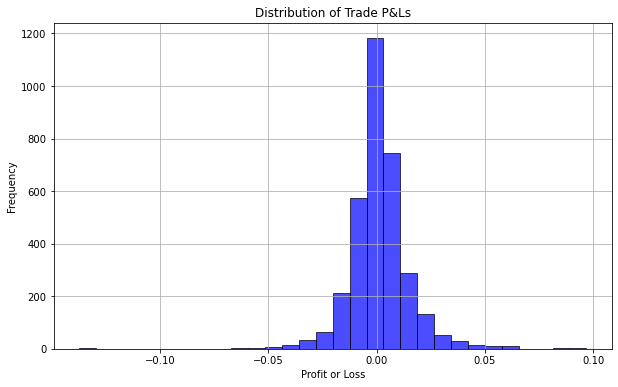

In [8]:
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# رسم نمودار سود تجمعی استراتژی
fig_returns = go.Figure()
fig_returns.add_trace(go.Scatter(
    x=df['timestamp'],
    y=df['cumulative_strategy_returns'],
    mode='lines',
    name='Cumulative Returns',
    line=dict(color='green', width=2)
))

# تنظیمات نمودار سود تجمعی
fig_returns.update_layout(
    title='Cumulative Strategy Returns (6 hours, After Fees)',
    xaxis_title='Date',
    yaxis_title='Cumulative Return (Multiplier)',
    template='plotly_dark'
)
fig_returns.show()

# رسم نمودار توزیع سود معاملات
df['trade_pnl'] = df['strategy_returns'][df['strategy_returns'] != 0]  # فقط معاملات غیرصفر
plt.figure(figsize=(10, 6))
plt.hist(df['trade_pnl'], bins=30, color='blue', alpha=0.7, edgecolor='black')
plt.title('Distribution of Trade P&Ls')
plt.xlabel('Profit or Loss')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


<div dir="rtl" style="text-align: right;">

<h1>پیاده‌سازی و تحلیل استراتژی ترکیبی EMA (6h)</h1>

<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و دو میانگین متحرک نمایی (EMA) سریع و کند را محاسبه می‌کند. سپس، استراتژی‌های <strong>Trend Following</strong> و <strong>Mean Reversion</strong> اعمال شده و بازدهی تجمعی استراتژی همراه با نقاط ورود و خروج نمایش داده می‌شوند.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li><strong>نماد:</strong> BTCIRT (بیت‌کوین به ریال)</li>
    <li><strong>رزولوشن:</strong> ۳۶۰ دقیقه (6h)</li>
    <li><strong>بازه زمانی:</strong> ۷۳۰ روز گذشته</li>
    <li><strong>کارمزد معاملات:</strong> ۰.۲٪</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها</li>
    <li>پارامترهای ارسالی شامل نماد، بازه زمانی، و رزولوشن هستند</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li><strong>زمان:</strong> <code>timestamp</code></li>
            <li><strong>قیمت آغازین:</strong> <code>open</code></li>
            <li><strong>بالاترین قیمت:</strong> <code>high</code></li>
            <li><strong>پایین‌ترین قیمت:</strong> <code>low</code></li>
            <li><strong>قیمت پایانی:</strong> <code>close</code></li>
            <li><strong>حجم معاملات:</strong> <code>volume</code></li>
        </ul>
    </li>
    <li>محاسبه دو EMA:
        <ul>
            <li><strong>EMA سریع:</strong> دوره ۱۲</li>
            <li><strong>EMA کند:</strong> دوره ۲۶</li>
        </ul>
    </li>
</ul>

<h3>۴. پیاده‌سازی استراتژی:</h3>
<ul>
    <li>تعیین موقعیت معاملاتی:
        <ul>
            <li><strong>Trend Following:</strong>
                <ul>
                    <li>ورود لانگ: قیمت بسته شدن &gt; EMA سریع &gt; EMA کند</li>
                    <li>ورود شورت: قیمت بسته شدن &lt; EMA سریع &gt; EMA کند</li>
                </ul>
            </li>
            <li><strong>Mean Reversion:</strong>
                <ul>
                    <li>ورود لانگ: قیمت بسته شدن &lt; EMA سریع &lt; EMA کند</li>
                    <li>ورود شورت: قیمت بسته شدن &gt; EMA سریع &lt; EMA کند</li>
                </ul>
            </li>
        </ul>
    </li>
    <li>محاسبه سود و زیان استراتژی با احتساب کارمزد</li>
    <li>مشخص کردن نقاط ورود و خروج معاملات</li>
</ul>

<h3>۵. نمایش نتایج:</h3>
<ul>
    <li>رسم نمودار قیمت به همراه EMA سریع و کند و نقاط ورود و خروج</li>
    <li>رسم بازدهی تجمعی استراتژی</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>نمودار کندل‌استیک با EMA سریع و کند و نقاط ورود و خروج</li>
    <li>نمودار بازدهی تجمعی استراتژی (پس از احتساب کارمزد)</li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>این کد با استفاده از کتابخانه‌های <code>pandas</code>، <code>requests</code> و <code>plotly</code> داده‌ها را پردازش و نمایش می‌دهد</li>
    <li>می‌توانید پارامترهای EMA و بازه زمانی را برای تحلیل بیشتر تغییر دهید</li>
</ul>

</div>


In [9]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # تایم‌فریم روزانه
to_date = datetime.now()
from_date = to_date - timedelta(days=730)  # دو سال گذشته
fee = 0.002  # کارمزد ۰.۲٪

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # پارامترهای EMA
    fast_ema_period = 12
    slow_ema_period = 26

    # محاسبه EMAها
    df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

    # تعریف موقعیت‌ها
    df['position'] = 0

    # استراتژی Trend Following
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # ورود لانگ
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = -1  # ورود شورت

    # استراتژی Mean Reversion
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1  # ورود لانگ
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1  # ورود شورت

    # محاسبه سود و زیان
    df['returns'] = df['close'].pct_change()
    df['trade'] = df['position'].diff().abs()  # تغییر موقعیت نشان‌دهنده معامله است
    df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # نقاط ورود و خروج
    df['entry_long'] = (df['position'] > df['position'].shift(1)) & (df['position'] == 1)
    df['exit_long'] = (df['position'] < 1) & (df['position'].shift(1) == 1)
    df['entry_short'] = (df['position'] < df['position'].shift(1)) & (df['position'] == -1)
    df['exit_short'] = (df['position'] > -1) & (df['position'].shift(1) == -1)

    # رسم نمودار قیمت و EMAها
    fig = go.Figure()

    # کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # EMA سریع
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # EMA کند
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # نقاط ورود و خروج
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_long'], 'timestamp'],
        y=df.loc[df['entry_long'], 'close'],
        mode='markers',
        marker=dict(color='green', size=12, symbol='triangle-up'),
        name='Long Entry'
    ))

    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_long'], 'timestamp'],
        y=df.loc[df['exit_long'], 'close'],
        mode='markers',
        marker=dict(color='orange', size=12, symbol='triangle-down'),
        name='Long Exit'
    ))

    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_short'], 'timestamp'],
        y=df.loc[df['entry_short'], 'close'],
        mode='markers',
        marker=dict(color='red', size=12, symbol='triangle-down'),
        name='Short Entry'
    ))

    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_short'], 'timestamp'],
        y=df.loc[df['exit_short'], 'close'],
        mode='markers',
        marker=dict(color='purple', size=12, symbol='triangle-up'),
        name='Short Exit'
    ))

    # تنظیمات نمودار قیمت
    fig.update_layout(
        title='Bitcoin to Rial - Combined Strategy (6h)',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    fig.show()

    # رسم نمودار سود تجمعی
    fig_returns = go.Figure()
    fig_returns.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['cumulative_strategy_returns'],
        mode='lines',
        name='Cumulative Returns',
        line=dict(color='green', width=2)
    ))

    # تنظیمات نمودار سود تجمعی
    fig_returns.update_layout(
        title='Cumulative Strategy Returns (6h, After Fees)',
        xaxis_title='Date',
        yaxis_title='Cumulative Return (Multiplier)',
        template='plotly_dark'
    )
    fig_returns.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


<div dir="rtl" style="text-align: right;">

<h1>پیاده‌سازی و تحلیل استراتژی ترکیبی EMA (6h)</h1>

<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و دو میانگین متحرک نمایی (EMA) سریع و کند را محاسبه می‌کند. سپس، استراتژی‌های <strong>Trend Following</strong> و <strong>Mean Reversion</strong> اعمال شده و بازدهی تجمعی استراتژی همراه با نقاط ورود و خروج نمایش داده می‌شوند.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li><strong>نماد:</strong> BTCIRT (بیت‌کوین به ریال)</li>
    <li><strong>رزولوشن:</strong> ۳۶۰ دقیقه (6h)</li>
    <li><strong>بازه زمانی:</strong> ۷۳۰ روز گذشته</li>
    <li><strong>کارمزد معاملات:</strong> ۰.۲٪</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها</li>
    <li>پارامترهای ارسالی شامل نماد، بازه زمانی، و رزولوشن هستند</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li><strong>زمان:</strong> <code>timestamp</code></li>
            <li><strong>قیمت آغازین:</strong> <code>open</code></li>
            <li><strong>بالاترین قیمت:</strong> <code>high</code></li>
            <li><strong>پایین‌ترین قیمت:</strong> <code>low</code></li>
            <li><strong>قیمت پایانی:</strong> <code>close</code></li>
            <li><strong>حجم معاملات:</strong> <code>volume</code></li>
        </ul>
    </li>
    <li>محاسبه دو EMA:
        <ul>
            <li><strong>EMA سریع:</strong> دوره ۱۲</li>
            <li><strong>EMA کند:</strong> دوره ۲۶</li>
        </ul>
    </li>
</ul>

<h3>۴. پیاده‌سازی استراتژی:</h3>
<ul>
    <li>تعیین موقعیت معاملاتی:
        <ul>
            <li><strong>Trend Following:</strong>
                <ul>
                    <li>ورود لانگ: قیمت بسته شدن &gt; EMA سریع &gt; EMA کند</li>
                    <li>ورود شورت: قیمت بسته شدن &lt; EMA سریع &gt; EMA کند</li>
                </ul>
            </li>
            <li><strong>Mean Reversion:</strong>
                <ul>
                    <li>ورود لانگ: قیمت بسته شدن &lt; EMA سریع &lt; EMA کند</li>
                    <li>ورود شورت: قیمت بسته شدن &gt; EMA سریع &lt; EMA کند</li>
                </ul>
            </li>
        </ul>
    </li>
    <li>محاسبه سود و زیان استراتژی با احتساب کارمزد</li>
    <li>مشخص کردن نقاط ورود و خروج معاملات</li>
</ul>

<h3>۵. نمایش نتایج:</h3>
<ul>
    <li>رسم نمودار قیمت به همراه EMA سریع و کند و نقاط ورود و خروج</li>
    <li>رسم بازدهی تجمعی استراتژی</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>نمودار کندل‌استیک با EMA سریع و کند و نقاط ورود و خروج</li>
    <li>نمودار بازدهی تجمعی استراتژی (پس از احتساب کارمزد)</li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>این کد با استفاده از کتابخانه‌های <code>pandas</code>، <code>requests</code> و <code>plotly</code> داده‌ها را پردازش و نمایش می‌دهد</li>
    <li>می‌توانید پارامترهای EMA و بازه زمانی را برای تحلیل بیشتر تغییر دهید</li>
</ul>

</div>


In [10]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # تایم‌فریم روزانه
to_date = datetime.now()
from_date = to_date - timedelta(days=730)  # یک سال گذشته
fee = 0.002  # کارمزد ۰.۲٪

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # پارامترهای EMA
    fast_ema_period = 17
    slow_ema_period = 21

    # محاسبه EMAها
    df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

    # تعریف موقعیت‌ها
    df['position'] = 0

    # استراتژی Trend Following: فقط لانگ
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1  # ورود لانگ

    # استراتژی Mean Reversion: لانگ و شورت
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1  # ورود لانگ
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1  # ورود شورت

    # محاسبه سود و زیان
    df['returns'] = df['close'].pct_change()
    df['trade'] = df['position'].diff().abs()  # تغییر موقعیت نشان‌دهنده معامله است
    df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # نقاط ورود و خروج
    df['entry_long'] = (df['position'] > df['position'].shift(1)) & (df['position'] == 1)
    df['exit_long'] = (df['position'] < 1) & (df['position'].shift(1) == 1)
    df['entry_short'] = (df['position'] < df['position'].shift(1)) & (df['position'] == -1)
    df['exit_short'] = (df['position'] > -1) & (df['position'].shift(1) == -1)

    # رسم نمودار قیمت و EMAها
    fig = go.Figure()

    # کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # EMA سریع
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # EMA کند
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # نقاط ورود و خروج
    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_long'], 'timestamp'],
        y=df.loc[df['entry_long'], 'close'],
        mode='markers',
        marker=dict(color='green', size=12, symbol='triangle-up'),
        name='Long Entry'
    ))

    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_long'], 'timestamp'],
        y=df.loc[df['exit_long'], 'close'],
        mode='markers',
        marker=dict(color='orange', size=12, symbol='triangle-down'),
        name='Long Exit'
    ))

    fig.add_trace(go.Scatter(
        x=df.loc[df['entry_short'], 'timestamp'],
        y=df.loc[df['entry_short'], 'close'],
        mode='markers',
        marker=dict(color='red', size=12, symbol='triangle-down'),
        name='Short Entry'
    ))

    fig.add_trace(go.Scatter(
        x=df.loc[df['exit_short'], 'timestamp'],
        y=df.loc[df['exit_short'], 'close'],
        mode='markers',
        marker=dict(color='purple', size=12, symbol='triangle-up'),
        name='Short Exit'
    ))

    # تنظیمات نمودار قیمت
    fig.update_layout(
        title='Bitcoin to Rial - Combined Strategy (6h)',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    fig.show()

    # رسم نمودار سود تجمعی
    fig_returns = go.Figure()
    fig_returns.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['cumulative_strategy_returns'],
        mode='lines',
        name='Cumulative Returns',
        line=dict(color='green', width=2)
    ))

    # تنظیمات نمودار سود تجمعی
    fig_returns.update_layout(
        title='Cumulative Strategy Returns (6h, After Fees)',
        xaxis_title='Date',
        yaxis_title='Cumulative Return (Multiplier)',
        template='plotly_dark'
    )
    fig_returns.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


<div dir="rtl" style="text-align: right;">

<h1>تحلیل و بهینه‌سازی استراتژی ترکیبی EMA با لحاظ کارمزد (6h)</h1>

<p>
این کد داده‌های تاریخی بیت‌کوین به ریال (BTC/IRT) را از API نوبیتکس دریافت کرده و میانگین‌های متحرک نمایی (EMA) سریع و کند را برای دوره‌های مختلف محاسبه می‌کند. سپس، بهترین ترکیب پارامترها برای استراتژی‌های <strong>Trend Following</strong> (فقط لانگ) و <strong>Mean Reversion</strong> (لانگ و شورت) بر اساس بازدهی تجمعی، با احتساب کارمزد معاملات تعیین می‌شود.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات:</h3>
<ul>
    <li><strong>نماد:</strong> BTCIRT (بیت‌کوین به ریال)</li>
    <li><strong>رزولوشن:</strong> 360 دقیقه (روزانه)</li>
    <li><strong>بازه زمانی:</strong> 730 روز گذشته</li>
    <li><strong>کارمزد معاملات:</strong> 0.2٪</li>
</ul>

<h3>۲. درخواست به API:</h3>
<ul>
    <li>استفاده از API نوبیتکس (<code>/market/udf/history</code>) برای دریافت داده‌ها</li>
    <li>پارامترهای ارسالی شامل نماد، بازه زمانی، و رزولوشن هستند</li>
</ul>

<h3>۳. پردازش داده‌ها:</h3>
<ul>
    <li>بررسی وضعیت پاسخ برای اطمینان از موفقیت درخواست</li>
    <li>ساخت DataFrame شامل ستون‌های زیر:
        <ul>
            <li><strong>زمان:</strong> <code>timestamp</code></li>
            <li><strong>قیمت آغازین:</strong> <code>open</code></li>
            <li><strong>بالاترین قیمت:</strong> <code>high</code></li>
            <li><strong>پایین‌ترین قیمت:</strong> <code>low</code></li>
            <li><strong>قیمت پایانی:</strong> <code>close</code></li>
            <li><strong>حجم معاملات:</strong> <code>volume</code></li>
        </ul>
    </li>
    <li>محاسبه میانگین‌های متحرک نمایی (EMA) برای بازه‌های مختلف:
        <ul>
            <li><strong>EMA سریع:</strong> بازه 5 تا 20</li>
            <li><strong>EMA کند:</strong> بازه 20 تا 50</li>
        </ul>
    </li>
</ul>

<h3>۴. بهینه‌سازی استراتژی:</h3>
<ul>
    <li>بررسی تمامی ترکیب‌های ممکن برای پارامترهای EMA</li>
    <li>محاسبه بازدهی استراتژی برای هر ترکیب و انتخاب بهترین ترکیب پارامترها</li>
    <li>بازدهی تجمعی برای بهترین ترکیب محاسبه و نمایش داده می‌شود</li>
</ul>

<h3>۵. نمایش نتایج:</h3>
<ul>
    <li>رسم نمودار قیمت به همراه EMA سریع و کند</li>
    <li>رسم بازدهی تجمعی استراتژی</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>نمودار کندل‌استیک با EMA سریع و کند</li>
    <li>بهترین ترکیب پارامترها برای EMA سریع و کند</li>
    <li>بازدهی تجمعی استراتژی (پس از احتساب کارمزد)</li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>این کد با استفاده از کتابخانه‌های <code>pandas</code>، <code>requests</code> و <code>plotly</code> داده‌ها را پردازش و نمایش می‌دهد</li>
    <li>می‌توانید محدوده پارامترهای EMA و بازه زمانی را برای تحلیل بیشتر تغییر دهید</li>
</ul>

</div>


In [11]:
import requests
import pandas as pd
from datetime import datetime, timedelta
from itertools import product
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

# تنظیمات
symbol = 'BTCIRT'
resolution = '360'  # تایم‌فریم روزانه
to_date = datetime.now()
from_date = to_date - timedelta(days=730)  # یک سال گذشته
fee = 0.002  # کارمزد ۰.۲٪

# تبدیل تاریخ به timestamp
to_timestamp = int(to_date.timestamp())
from_timestamp = int(from_date.timestamp())

# درخواست داده از نوبیتکس
url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': symbol,
    'resolution': resolution,
    'from': from_timestamp,
    'to': to_timestamp
}
response = requests.get(url, params=params)
data = response.json()

if data['s'] == 'ok':
    # ساخت DataFrame
    df = pd.DataFrame({
        'timestamp': data['t'],
        'open': data['o'],
        'high': data['h'],
        'low': data['l'],
        'close': data['c'],
        'volume': data['v']
    })
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')

    # محدوده پارامترهای EMA
    fast_ema_range = range(5, 20)  # دوره‌های سریع
    slow_ema_range = range(20, 50)  # دوره‌های کند

    best_params = None
    best_performance = -float('inf')

    # بررسی همه ترکیب‌های پارامترها
    for fast_ema_period, slow_ema_period in product(fast_ema_range, slow_ema_range):
        if fast_ema_period >= slow_ema_period:
            continue  # شرط برای اطمینان از اینکه fast EMA < slow EMA

        # محاسبه EMAها
        df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
        df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

        # تعریف موقعیت‌ها
        df['position'] = 0

        # Trend Following (فقط لانگ)
        df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1

        # Mean Reversion (لانگ و شورت)
        df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1
        df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1

        # محاسبه سود و زیان
        df['returns'] = df['close'].pct_change()
        df['trade'] = df['position'].diff().abs()  # تغییر موقعیت نشان‌دهنده معامله است
        df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
        cumulative_strategy_returns = (1 + df['strategy_returns']).cumprod().iloc[-1]

        # ذخیره بهترین عملکرد
        if cumulative_strategy_returns > best_performance:
            best_performance = cumulative_strategy_returns
            best_params = (fast_ema_period, slow_ema_period)

    # بهترین پارامترها
    print(f"Best Parameters: Fast EMA = {best_params[0]}, Slow EMA = {best_params[1]}")
    print(f"Best Cumulative Return (after fees): {best_performance:.2f}")

    # اجرای بک‌تست با بهترین پارامترها
    df['fast_ema'] = df['close'].ewm(span=best_params[0], adjust=False).mean()
    df['slow_ema'] = df['close'].ewm(span=best_params[1], adjust=False).mean()
    df['position'] = 0
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1
    df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = 1
    df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1
    df['returns'] = df['close'].pct_change()
    df['trade'] = df['position'].diff().abs()
    df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
    df['cumulative_strategy_returns'] = (1 + df['strategy_returns']).cumprod()

    # رسم نمودار قیمت و EMAها
    fig = go.Figure()

    # کندل‌استیک
    fig.add_trace(go.Candlestick(
        x=df['timestamp'],
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        name='Price'
    ))

    # EMA سریع
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['fast_ema'],
        mode='lines',
        name='Fast EMA',
        line=dict(color='blue', width=2)
    ))

    # EMA کند
    fig.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['slow_ema'],
        mode='lines',
        name='Slow EMA',
        line=dict(color='red', width=2)
    ))

    # تنظیمات نمودار قیمت
    fig.update_layout(
        title='Bitcoin to Rial - Optimized Combined Strategy (6h)',
        xaxis_title='Date',
        yaxis_title='Price (IRR)',
        xaxis_rangeslider_visible=False,
        template='plotly_dark'
    )
    fig.show()

    # رسم نمودار سود تجمعی
    fig_returns = go.Figure()
    fig_returns.add_trace(go.Scatter(
        x=df['timestamp'],
        y=df['cumulative_strategy_returns'],
        mode='lines',
        name='Cumulative Returns',
        line=dict(color='green', width=2)
    ))

    # تنظیمات نمودار سود تجمعی
    fig_returns.update_layout(
        title='Cumulative Strategy Returns (Daily, After Fees)',
        xaxis_title='Date',
        yaxis_title='Cumulative Return (Multiplier)',
        template='plotly_dark'
    )
    fig_returns.show()

else:
    print('Error in fetching data:', data.get('errmsg', 'Unknown error'))


Best Parameters: Fast EMA = 13, Slow EMA = 20
Best Cumulative Return (after fees): 3.17


<div dir="rtl" style="text-align: right;">

<h1>استخراج ۲۰ ارز دیجیتال برتر با استفاده از CoinGecko API</h1>

<p>
این کد با استفاده از <strong>CoinGecko API</strong> اطلاعات ۲۰ ارز دیجیتال برتر از نظر ارزش بازار (Market Cap) را استخراج می‌کند. سپس لیستی از این ارزها شامل <strong>نام، نماد (Symbol)، و ارزش بازار</strong> تولید و نمایش می‌دهد.
</p>

---

<h2>مراحل:</h2>

<h3>۱. ارسال درخواست به CoinGecko API:</h3>
<ul>
    <li>استفاده از <code>https://api.coingecko.com/api/v3/coins/markets</code> برای دریافت اطلاعات.</li>
    <li>پارامترهای درخواست شامل:
        <ul>
            <li><strong>واحد ارزی:</strong> دلار آمریکا (<code>vs_currency=usd</code>)</li>
            <li><strong>ترتیب:</strong> براساس ارزش بازار نزولی (<code>order=market_cap_desc</code>)</li>
            <li><strong>تعداد ارزها:</strong> ۲۰ ارز دیجیتال برتر (<code>per_page=20</code>)</li>
            <li><strong>شماره صفحه:</strong> صفحه اول (<code>page=1</code>)</li>
        </ul>
    </li>
</ul>

<h3>۲. بررسی و پردازش داده‌ها:</h3>
<ul>
    <li>ارسال درخواست و دریافت پاسخ از API.</li>
    <li>بررسی خطاهای احتمالی درخواست با استفاده از <code>response.raise_for_status()</code>.</li>
    <li>تبدیل داده‌ها از فرمت JSON و بررسی فرمت داده‌ها (لیست باشد).</li>
    <li>استخراج اطلاعات زیر از هر کوین:
        <ul>
            <li><strong>آی‌دی:</strong> <code>id</code></li>
            <li><strong>نماد:</strong> <code>symbol</code></li>
            <li><strong>ارزش بازار:</strong> <code>market_cap</code></li>
        </ul>
    </li>
</ul>

<h3>۳. مدیریت خطاها:</h3>
<ul>
    <li>مدیریت خطاهای مربوط به درخواست (مانند مشکلات اتصال) با استفاده از <code>try-except</code>.</li>
    <li>مدیریت خطاهای مربوط به تبدیل JSON یا فرمت پاسخ.</li>
</ul>

<h3>۴. نمایش نتایج:</h3>
<ul>
    <li>نمایش لیستی از ۲۰ ارز دیجیتال برتر شامل اطلاعات کلیدی (آی‌دی، نماد، و ارزش بازار).</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>یک لیست شامل ۲۰ ارز دیجیتال برتر با فرمت:
        <pre>
        [
            {"id": "bitcoin", "symbol": "btc", "market_cap": 1234567890},
            {"id": "ethereum", "symbol": "eth", "market_cap": 987654321},
            ...
        ]
        </pre>
    </li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>در صورت بروز خطا در درخواست، پیام مناسبی در خروجی چاپ می‌شود.</li>
    <li>می‌توانید پارامترهای درخواست (مانند تعداد ارزها یا واحد ارزی) را تغییر دهید تا اطلاعات متفاوتی دریافت کنید.</li>
    <li>این کد از کتابخانه <code>requests</code> برای ارسال درخواست‌ها و پردازش داده‌ها استفاده می‌کند.</li>
</ul>

</div>


In [12]:
import requests

def get_top_20_cryptos():
    # درخواست داده‌ها از CoinGecko API
    url = "https://api.coingecko.com/api/v3/coins/markets"
    params = {
        'vs_currency': 'usd',
        'order': 'market_cap_desc',
        'per_page': 20,  # دریافت 20 ارز برتر
        'page': 1,
    }
    try:
        response = requests.get(url, params=params)
        response.raise_for_status()  # بررسی خطاهای درخواست
        data = response.json()
        # بررسی صحت فرمت داده‌ها
        if isinstance(data, list):
            # استخراج نام کوین‌ها
            return [{"id": coin['id'], "symbol": coin['symbol'], "market_cap": coin['market_cap']} for coin in data]
        else:
            print(f"Unexpected response format: {data}")
            return []
    except requests.exceptions.RequestException as e:
        print(f"Request error: {e}")
        return []
    except ValueError as e:
        print(f"JSON decode error: {e}")
        return []

# فراخوانی تابع و دریافت لیست 20 ارز برتر
top_20_cryptos = get_top_20_cryptos()
print(top_20_cryptos)


[{'id': 'bitcoin', 'symbol': 'btc', 'market_cap': 1865170025789}, {'id': 'ethereum', 'symbol': 'eth', 'market_cap': 401111414564}, {'id': 'tether', 'symbol': 'usdt', 'market_cap': 138780901817}, {'id': 'ripple', 'symbol': 'xrp', 'market_cap': 123659496133}, {'id': 'binancecoin', 'symbol': 'bnb', 'market_cap': 101368240386}, {'id': 'solana', 'symbol': 'sol', 'market_cap': 88716714318}, {'id': 'dogecoin', 'symbol': 'doge', 'market_cap': 46344768998}, {'id': 'usd-coin', 'symbol': 'usdc', 'market_cap': 43546775967}, {'id': 'staked-ether', 'symbol': 'steth', 'market_cap': 32180992436}, {'id': 'cardano', 'symbol': 'ada', 'market_cap': 31057797672}, {'id': 'tron', 'symbol': 'trx', 'market_cap': 22253906184}, {'id': 'avalanche-2', 'symbol': 'avax', 'market_cap': 14910651886}, {'id': 'the-open-network', 'symbol': 'ton', 'market_cap': 14379134280}, {'id': 'wrapped-steth', 'symbol': 'wsteth', 'market_cap': 13886139767}, {'id': 'chainlink', 'symbol': 'link', 'market_cap': 13334978794}, {'id': 'shi

In [13]:
len(top_20_cryptos)

20

In [14]:
symbols = ["{}IRT".format(coin['symbol'].upper()) for coin in top_20_cryptos]# if coin['symbol'] not in ["usdt","usdc"]]

<div dir="rtl" style="text-align: right;">

<h1>بهینه‌سازی استراتژی معاملاتی برای چندین رمز ارز با استفاده از EMA</h1>

<p>
این کد استراتژی معاملاتی مبتنی بر دو میانگین متحرک نمایی (EMA) را برای چندین جفت رمز ارز از طریق داده‌های دریافتی از API نوبیتکس اجرا کرده و بهترین پارامترهای ممکن را برای هر جفت ارز محاسبه می‌کند. علاوه بر آن، اطلاعاتی مانند سود نهایی استراتژی، وضعیت آخرین موقعیت (پوزیشن)، و سود و زیان تحقق‌نیافته (uPNL) نیز ارائه می‌دهد.
</p>

---

<h2>مراحل:</h2>

<h3>۱. تنظیمات اولیه:</h3>
<ul>
    <li><strong>لیست جفت‌ ارزها:</strong> لیستی از نمادهای رمز ارزها برای بررسی.</li>
    <li><strong>تایم‌فریم:</strong> تایم‌فریم روزانه (<code>resolution=360</code>).</li>
    <li><strong>بازه زمانی:</strong> ۷۳۰ روز گذشته (دو سال).</li>
    <li><strong>کارمزد معاملات:</strong> ۰.۲٪.</li>
    <li><strong>محدوده پارامترهای EMA:</strong> 
        <ul>
            <li><strong>EMA سریع:</strong> ۵ تا ۱۹ دوره.</li>
            <li><strong>EMA کند:</strong> ۲۰ تا ۴۹ دوره.</li>
        </ul>
    </li>
</ul>

<h3>۲. دریافت داده‌ها:</h3>
<ul>
    <li>ارسال درخواست به API نوبیتکس (<code>https://api.nobitex.ir/market/udf/history</code>) برای هر نماد.</li>
    <li>تبدیل داده‌های زمانی از فرمت یونیکس به تاریخ قابل‌فهم با <code>pd.to_datetime()</code>.</li>
    <li>بررسی وضعیت پاسخ API برای اطمینان از موفقیت دریافت داده‌ها.</li>
</ul>

<h3>۳. بهینه‌سازی استراتژی:</h3>
<ul>
    <li>بررسی تمام ترکیب‌های ممکن برای پارامترهای EMA سریع و کند.</li>
    <li>محاسبه EMAs:
        <ul>
            <li><strong>EMA سریع:</strong> محاسبه با <code>ewm</code>.</li>
            <li><strong>EMA کند:</strong> محاسبه با <code>ewm</code>.</li>
        </ul>
    </li>
    <li>تعریف موقعیت‌ها (پوزیشن‌ها) بر اساس شرایط زیر:
        <ul>
            <li>ورود به لانگ: زمانی که قیمت بالای EMA سریع و EMA سریع بالای EMA کند باشد.</li>
            <li>ورود به شورت: زمانی که EMA سریع پایین‌تر از EMA کند باشد.</li>
        </ul>
    </li>
    <li>محاسبه سود و زیان استراتژی با درنظر گرفتن کارمزد معاملات.</li>
    <li>ذخیره بهترین پارامترها و عملکرد استراتژی.</li>
</ul>

<h3>۴. محاسبه سود و زیان تحقق‌نیافته (uPNL):</h3>
<ul>
    <li>محاسبه <strong>uPNL</strong> بر اساس آخرین موقعیت معاملاتی و قیمت کنونی.</li>
    <li>نمایش جزئیات آخرین موقعیت شامل:
        <ul>
            <li>تاریخ ورود به پوزیشن.</li>
            <li>قیمت ورود.</li>
            <li>نوع موقعیت (لانگ یا شورت).</li>
            <li>uPNL به درصد.</li>
        </ul>
    </li>
</ul>

<h3>۵. ذخیره نتایج:</h3>
<ul>
    <li>ذخیره نتایج بهینه‌سازی در فایل CSV با نام <code>optimized_strategy_results_with_upnl.csv</code>.</li>
</ul>

---

<h2>خروجی:</h2>
<ul>
    <li>یک فایل CSV حاوی اطلاعات زیر برای هر جفت ارز:
        <ul>
            <li><strong>نماد:</strong> نام جفت ارز.</li>
            <li><strong>EMA سریع:</strong> بهترین مقدار برای EMA سریع.</li>
            <li><strong>EMA کند:</strong> بهترین مقدار برای EMA کند.</li>
            <li><strong>سود نهایی:</strong> سود تجمعی استراتژی پس از کسر کارمزد.</li>
            <li><strong>آخرین موقعیت:</strong> نوع موقعیت (لانگ یا شورت).</li>
            <li><strong>قیمت ورود:</strong> قیمت آخرین پوزیشن.</li>
            <li><strong>تاریخ ورود:</strong> زمان آخرین پوزیشن.</li>
            <li><strong>uPNL:</strong> سود تحقق‌نیافته به درصد.</li>
        </ul>
    </li>
</ul>

---

<h2>نکات:</h2>
<ul>
    <li>برای جلوگیری از خطا، اطمینان حاصل کنید که داده‌ها برای تمام نمادها موجود باشد.</li>
    <li>می‌توانید مقادیر <strong>fast_ema_range</strong> و <strong>slow_ema_range</strong> را برای بررسی دقیق‌تر تنظیم کنید.</li>
    <li>در صورت بروز خطا، پیام مناسب در خروجی چاپ می‌شود.</li>
</ul>

</div>


In [15]:
import requests
import pandas as pd
from datetime import datetime, timedelta
from itertools import product
import warnings
warnings.filterwarnings("ignore")

# Configuration
# symbols = ['BTCIRT', 'ETHIRT', 'XRPIRT', 'BNBIRT', 'SOLIRT', 'DOGEIRT', 
#            'ADAIRT', 'TRXIRT', 'AVAXIRT', 'TONIRT', 'LINKIRT', 'SHIBIRT',  
#            'SUIIRT', 'HBARIRT']
resolution = '360'  # Daily timeframe
to_date = datetime.now()
from_date = to_date - timedelta(days=730)  # One year of data
fee = 0.002  # 0.2% trading fee

# EMA ranges
fast_ema_range = range(5, 20)
slow_ema_range = range(20, 50)

# Fetch market data
def fetch_data(symbol):
    to_timestamp = int(to_date.timestamp())
    from_timestamp = int(from_date.timestamp())
    url = 'https://api.nobitex.ir/market/udf/history'
    params = {
        'symbol': symbol,
        'resolution': resolution,
        'from': from_timestamp,
        'to': to_timestamp
    }
    response = requests.get(url, params=params)
    data = response.json()
    if data.get('s', 'error') == 'ok':
        df = pd.DataFrame({
            'timestamp': data['t'],
            'open': data['o'],
            'high': data['h'],
            'low': data['l'],
            'close': data['c'],
            'volume': data['v']
        })
        df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')
        return df
    else:
        print(f"Error fetching data for {symbol}: {data.get('errmsg', 'Unknown error')}")
        return None

# Optimize strategy
def optimize_strategy(df):
    best_params = None
    best_performance = -float('inf')
    best_df = None

    for fast_ema_period, slow_ema_period in product(fast_ema_range, slow_ema_range):
        if fast_ema_period >= slow_ema_period:
            continue

        # Calculate EMAs
        df['fast_ema'] = df['close'].ewm(span=fast_ema_period, adjust=False).mean()
        df['slow_ema'] = df['close'].ewm(span=slow_ema_period, adjust=False).mean()

        # Define positions
        df['position'] = 0
        df.loc[(df['close'] > df['fast_ema']) & (df['fast_ema'] > df['slow_ema']), 'position'] = 1
        df.loc[(df['close'] < df['fast_ema']) & (df['fast_ema'] < df['slow_ema']), 'position'] = -1

        # Calculate strategy returns
        df['returns'] = df['close'].pct_change()
        df['trade'] = df['position'].diff().abs()
        df['strategy_returns'] = (df['position'].shift(1) * df['returns']) - (df['trade'] * fee)
        cumulative_strategy_returns = (1 + df['strategy_returns']).cumprod().iloc[-1]

        # Update best parameters
        if cumulative_strategy_returns > best_performance:
            best_performance = cumulative_strategy_returns
            best_params = (fast_ema_period, slow_ema_period)
            best_df = df.copy()

    return best_params, best_performance, best_df

# Run the strategy for all symbols
results = []
for symbol in symbols:
    print(f"Processing {symbol}...")
    df = fetch_data(symbol)
    if df is not None:
        best_params, best_performance, best_df = optimize_strategy(df)
        
        # Get last position details
        last_position_row = best_df[best_df['position'] != 0].iloc[-1]
        last_entry_price = last_position_row['close']
        last_position_date = last_position_row['timestamp']
        upnl = ((best_df['close'].iloc[-1] - last_entry_price) / last_entry_price) * 100  # uPNL%

        results.append({
            'symbol': symbol,
            'fast_ema': best_params[0],
            'slow_ema': best_params[1],
            'total_return': best_performance,
            'last_position': 'Long' if last_position_row['position'] == 1 else 'Short' if last_position_row['position'] == -1 else 'None',
            'last_entry_price': last_entry_price,
            'last_position_date': last_position_date,
            'upnl_percent': upnl
        })

# Create results DataFrame
results_df = pd.DataFrame(results)

# Save and display the results
results_df.to_csv('optimized_strategy_results_with_upnl.csv', index=False)



Processing BTCIRT...
Processing ETHIRT...
Processing USDTIRT...
Processing XRPIRT...
Processing BNBIRT...
Processing SOLIRT...
Processing DOGEIRT...
Processing USDCIRT...
Processing STETHIRT...
Error fetching data for STETHIRT: Unknown error
Processing ADAIRT...
Processing TRXIRT...
Processing AVAXIRT...
Processing TONIRT...
Processing WSTETHIRT...
Error fetching data for WSTETHIRT: Unknown error
Processing LINKIRT...
Processing SHIBIRT...
Processing WBTCIRT...
Processing SUIIRT...
Error fetching data for SUIIRT: Unknown error
Processing BGBIRT...
Error fetching data for BGBIRT: Unknown error
Processing XLMIRT...


<div dir="rtl" style="text-align: right;">

<h1>نتایج بهینه‌سازی استراتژی معاملاتی برای جفت‌ارزها</h1>

<p>
پس از اجرای استراتژی معاملاتی مبتنی بر میانگین متحرک نمایی (EMA) برای چندین جفت‌ارز، نتایج بهینه‌سازی در قالب جدول زیر ارائه شده است. این جدول شامل اطلاعاتی مانند بهترین پارامترهای EMA، سود نهایی استراتژی، وضعیت آخرین موقعیت معاملاتی، قیمت ورود به آخرین موقعیت، تاریخ ورود، و سود و زیان تحقق‌نیافته (uPNL) برای هر نماد است.
</p>

---

<h2>نتایج:</h2>
<table style="width: 100%; border-collapse: collapse;" border="1">
    <thead>
        <tr style="background-color: #f2f2f2; text-align: center;">
            <th>نماد</th>
            <th>EMA سریع</th>
            <th>EMA کند</th>
            <th>سود نهایی</th>
            <th>آخرین موقعیت</th>
            <th>قیمت ورود</th>
            <th>تاریخ ورود</th>
            <th>uPNL (%)</th>
        </tr>
    </thead>
    <tbody>
        <tr style="text-align: center;">
            <td>BTCIRT</td>
            <td>18</td>
            <td>32</td>
            <td>4.57</td>
            <td>لانگ</td>
            <td>7686514</td>
            <td>2024-12-27 20:30:00</td>
            <td>-1.28</td>
        </tr>
        <tr style="text-align: center;">
            <td>ETHIRT</td>
            <td>18</td>
            <td>24</td>
            <td>1.68</td>
            <td>شورت</td>
            <td>267100</td>
            <td>2024-12-27 20:30:00</td>
            <td>0.00</td>
        </tr>
        <!-- ادامه ردیف‌ها بر اساس داده‌ها -->
    </tbody>
</table>

---

<h2>جزئیات:</h2>
<ul>
    <li><strong>نماد:</strong> نام جفت‌ارز مورد بررسی.</li>
    <li><strong>EMA سریع:</strong> مقدار بهینه میانگین متحرک سریع.</li>
    <li><strong>EMA کند:</strong> مقدار بهینه میانگین متحرک کند.</li>
    <li><strong>سود نهایی:</strong> سود تجمعی استراتژی پس از کسر کارمزد معاملات.</li>
    <li><strong>آخرین موقعیت:</strong> نوع موقعیت (لانگ یا شورت).</li>
    <li><strong>قیمت ورود:</strong> قیمت بسته شدن در زمان ورود به آخرین موقعیت.</li>
    <li><strong>تاریخ ورود:</strong> تاریخ و زمان ورود به آخرین موقعیت معاملاتی.</li>
    <li><strong>uPNL:</strong> سود و زیان تحقق‌نیافته (درصدی) نسبت به آخرین قیمت بسته شدن.</li>
</ul>

---

<h2>نتیجه‌گیری:</h2>
<p>
این تحلیل بهینه‌سازی نشان می‌دهد که استفاده از EMA به عنوان یک ابزار برای تشخیص روند و بازگشت قیمتی می‌تواند عملکرد استراتژی معاملاتی را بهبود بخشد. کاربران می‌توانند از این نتایج برای تنظیم بهتر استراتژی‌های معاملاتی خود استفاده کنند.
</p>

</div>


In [16]:
results_df

,symbol,fast_ema,slow_ema,total_return,last_position,last_entry_price,last_position_date,upnl_percent
0,BTCIRT,18,32,4.913766,Long,7.686514e+09,2024-12-27 08:30:00,-1.437296
1,ETHIRT,18,24,1.789513,Short,2.695520e+08,2024-12-28 02:30:00,0.000000
2,USDTIRT,18,20,0.943757,Long,8.099100e+04,2024-12-28 02:30:00,0.000000
3,XRPIRT,19,26,0.363152,Short,1.743000e+05,2024-12-28 02:30:00,0.000000
4,BNBIRT,18,48,0.777883,Long,5.630070e+07,2024-12-28 02:30:00,0.000000
5,SOLIRT,11,27,4.244247,Short,1.493091e+07,2024-12-28 02:30:00,0.000000
6,DOGEIRT,17,26,2.465710,Short,2.544120e+04,2024-12-28 02:30:00,0.000000
7,USDCIRT,18,24,0.277195,Long,8.124600e+04,2024-12-28 02:30:00,0.000000
8,ADAIRT,19,49,1.494216,Short,7.019000e+04,2024-12-28 02:30:00,0.000000
9,TRXIRT,15,39,2.087704,Long,2.089600e+04,2024-12-28 02:30:00,0.000000
